In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder

import gc
import warnings
warnings.filterwarnings('ignore')

import nbformat
print(nbformat.__version__)


5.10.4


In [2]:
import json

# Load the JSON file using the full path
with open(r'C:\Users\Owner\Downloads\kaggle.json') as f:  # Use raw string to avoid escape issues
    token_data = json.load(f)

# Now you can use token_data as needed
print(token_data)  # Example: print the contents of the JSON file

{'username': 'glogergracel', 'key': '88096b272f10b4780a3b8750030d1ea3'}


In [3]:
%%time
import os
import pandas as pd

# Load datasets using context managers
def load_datasets():
    try:
        # Define file paths (update these paths to your local paths)
        train_path = r"C:\Users\Owner\Desktop\BristTD1 Dataset\train.csv"  # Use raw string
        test_path = r"C:\Users\Owner\Desktop\BristTD1 Dataset\test.csv"                # Use raw string
        sample_submission_path = r"C:\Users\Owner\Desktop\BristTD1 Dataset\sample_submission.csv"  # Use raw string
        
        # Check if files exist
        if not (os.path.exists(train_path) and os.path.exists(test_path) and os.path.exists(sample_submission_path)):
            raise FileNotFoundError("One or more dataset files do not exist.")
        
        # Load CSV files
        train = pd.read_csv(train_path)
        test = pd.read_csv(test_path)
        sample_submission = pd.read_csv(sample_submission_path)
        
        print("Datasets loaded successfully.")
        return train, test, sample_submission
    
    except Exception as e:
        print(f"Error loading datasets: {e}")
        return None, None, None  # Return None for all datasets on error

# Attempt to load datasets
train, test, sample = load_datasets()

# Check if datasets were loaded successfully
if train is None or test is None or sample is None:
    print("Failed to load datasets. Please check the error messages above.")

Datasets loaded successfully.
CPU times: total: 8.73 s
Wall time: 29.2 s


In [4]:
# Display information for all datasets
# Display dataset information
def display_dataset_info(dataset, name):
    
    print("-----------------------------------------------------------------")

    print(f"{name} DataFrame Shape: Rows = {dataset.shape[0]}, Columns = {dataset.shape[1]}")
    
    total_missing = dataset.isnull().sum().sum()
    print(f"There are total {total_missing} missing values in the {name} DataFrame.") if total_missing > 0 else print(f"There are no missing values in the {name} DataFrame.")

    total_duplicates = dataset.duplicated().sum()
    print(f"There are {total_duplicates} duplicate rows in the {name} DataFrame.") if total_duplicates > 0 else print(f"There are no duplicate rows in the {name} DataFrame.")
    
    display(dataset.describe().style.set_caption(f"Descriptive Statistics for {name} Dataset").background_gradient(cmap="coolwarm"))
    print("-----------------------------------------------------------------")
    gc.collect()

datasets = [train, test, sample]
names = [ "Train", "Test", "Sample"]
for i in range(len(datasets)):
    display_dataset_info(datasets[i], names[i])

-----------------------------------------------------------------
Train DataFrame Shape: Rows = 177024, Columns = 508


There are total 40294794 missing values in the Train DataFrame.
There are no duplicate rows in the Train DataFrame.


-----------------------------------------------------------------
-----------------------------------------------------------------
Test DataFrame Shape: Rows = 3644, Columns = 507
There are total 862409 missing values in the Test DataFrame.
There are no duplicate rows in the Test DataFrame.


-----------------------------------------------------------------
-----------------------------------------------------------------
Sample DataFrame Shape: Rows = 3644, Columns = 2
There are no missing values in the Sample DataFrame.
There are no duplicate rows in the Sample DataFrame.


,bg+1:00
count,3644.000000
mean,8.665477
std,3.248307
min,2.200000
25%,6.300000
50%,8.000000
75%,10.300000
max,24.600000


-----------------------------------------------------------------


In [5]:
# Function to reduce memory usage
def reduce_memory(df):
    start_mem = df.memory_usage().sum() / 1024**2
    print(f"Memory usage before optimization: {start_mem:.2f} MB")

    for col in df.columns:
        col_type = df[col].dtype

        if col_type != object:
            if str(col_type).startswith("int"):
                df[col] = pd.to_numeric(df[col], downcast="integer")
            elif str(col_type).startswith("float"):
                df[col] = pd.to_numeric(df[col], downcast="float")
        else:
            df[col] = df[col].astype("category")

    end_mem = df.memory_usage().sum() / 1024**2
    print(f"Memory usage after optimization: {end_mem:.2f} MB")
    print(f"Reduced by {(100 * (start_mem - end_mem) / start_mem):.1f}%")

    return df

# Apply memory reduction
train = reduce_memory(train)
test = reduce_memory(test)

Memory usage before optimization: 686.10 MB


Memory usage after optimization: 311.18 MB
Reduced by 54.6%
Memory usage before optimization: 14.10 MB
Memory usage after optimization: 6.46 MB
Reduced by 54.2%


In [6]:
# Encode categorical variables  
categorical_columns = train.select_dtypes(include="category").columns  

for col in categorical_columns:  
    # Initialize the LabelEncoder  
    le = LabelEncoder()  
    
    # Fit and transform the categorical column  
    train[col] = le.fit_transform(train[col])  
    test[col] = le.fit_transform(test[col])
    # Save the encoder for inverse transformation later  

In [7]:
# Drop columns with more than 60% missing values
numeric_columns = train.select_dtypes("number")
train = train.dropna(thresh=int(0.6 * len(train)), axis=1)


# Calculate the variance of each column
variances = numeric_columns.var()

# Identify columns with low variance
low_variance_cols = variances[variances < 1].index.tolist()

# Drop the low variance columns
train = train.drop(columns=low_variance_cols)

# Optionally, print the dropped columns for reference
print("Dropped columns with low variance:", low_variance_cols)



Dropped columns with low variance: ['activity-4:10', 'activity-4:00', 'activity-3:55', 'activity-3:45', 'activity-3:40', 'activity-3:30', 'activity-3:25', 'activity-3:15', 'activity-3:10', 'activity-3:00', 'activity-2:55', 'activity-2:45', 'activity-2:40', 'activity-2:30', 'activity-2:25', 'activity-2:20', 'activity-2:15', 'activity-2:10', 'activity-2:00', 'activity-1:55', 'activity-1:50', 'activity-1:45', 'activity-1:40', 'activity-1:35', 'activity-1:30', 'activity-1:25', 'activity-1:20', 'activity-1:15', 'activity-1:10', 'activity-1:05', 'activity-1:00', 'activity-0:55', 'activity-0:50', 'activity-0:45', 'activity-0:40', 'activity-0:35', 'activity-0:30', 'activity-0:25']


In [8]:
# Selected columns
selected_columns = [
     "bg-2:45", "bg-2:30", "bg-2:15", "bg-2:00", "bg-1:45", 
    "bg-1:30", "bg-1:15","bg-1:00", "bg-0:45", "bg-0:30", 
    "bg-0:15", "bg-0:00", "bg+1:00", 
    "activity-3:35", "activity-4:05", "activity-3:50", 
    "activity-4:20", "activity-4:15", "activity-4:25", 
    "activity-3:05", "activity-3:20", "activity-0:05", 
    "activity-2:50", "activity-2:35", "activity-2:05", 
    "activity-0:20", "activity-0:15", "activity-0:10", 
    "activity-0:00", "activity-4:35", "activity-4:30", 
    "id", "activity-4:40", "activity-5:30", "time", 
    "p_num", "activity-5:55", "activity-5:50", 
    "activity-5:45", "activity-5:40", "activity-5:35", 
    "activity-5:25", "activity-4:45", "activity-5:20", 
    "activity-5:15", "activity-5:10", "activity-5:05", 
    "activity-5:00", "activity-4:55", "activity-4:50", 
]

# Select columns for train and test
train = train[selected_columns]
test = test[[col for col in selected_columns if col in test.columns]]

In [9]:
from sklearn.impute import KNNImputer
#this is a way of standardizing our data and using preprocessing

numeric_trainColl = train.select_dtypes("number")  
numeric_testColl = test.select_dtypes("number")  

imputer = KNNImputer(n_neighbors=5)
train_imputed = imputer.fit_transform(numeric_trainColl)
train = pd.DataFrame(train_imputed, columns=numeric_trainColl.columns)

imputer = KNNImputer(n_neighbors=5)
test_imputed = imputer.fit_transform(numeric_testColl)
test = pd.DataFrame(test_imputed, columns=numeric_testColl.columns)
gc.collect()

del numeric_trainColl, numeric_testColl, train_imputed, test_imputed

print("Remaining missing values in train:", train.isnull().sum().sum())
print("Remaining missing values in test:", test.isnull().sum().sum())

Remaining missing values in train: 0
Remaining missing values in test: 0


In [10]:
import plotly.express as px

fig = px.histogram(train, x='bg+1:00', nbins=30, title='Histogram of Bg+1:00', labels={'bg+1:00': 'Value'})
fig.update_layout(xaxis_title='Value', yaxis_title='Frequency')
fig.show()


In [11]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)  
Q1 = train['bg+1:00'].quantile(0.25)  
Q3 = train['bg+1:00'].quantile(0.75)  

# Calculate IQR  
IQR = Q3 - Q1  
# Define the bounds for outliers  
lower_bound = Q1 - 1.5 * IQR  
upper_bound = Q3 + 1.5 * IQR  

# Remove outliers  
df_cleaned = train[(train['bg+1:00'] >= lower_bound) & (train['bg+1:00'] <= upper_bound)]  
gc.collect()

del Q1, Q3, IQR, lower_bound, upper_bound #eliminate outliers using the IQR method

In [12]:
fig = px.histogram(df_cleaned, x='bg+1:00', nbins=30, title='Updated Histogram of Bg+1:00', labels={'bg+1:00': 'Value'})
fig.update_layout(xaxis_title='Value', yaxis_title='Frequency')
fig.show()



In [13]:
%%time  
import gc
from sklearn.metrics import mean_squared_error  
from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import StandardScaler  
from keras.models import Sequential  
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam

from keras.callbacks import EarlyStopping,ReduceLROnPlateau

X = df_cleaned.drop(columns="bg+1:00")  
y = df_cleaned['bg+1:00']  

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardizing the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# ANN model
ann_model = Sequential()
ann_model.add(Dense(64, input_dim=X_train_scaled.shape[1], activation='relu'))
ann_model.add(Dropout(0.3))  # Dropout for regularization
ann_model.add(Dense(32, activation='relu'))
ann_model.add(Dropout(0.3))  # Another dropout layer
ann_model.add(Dense(1))

# Compile the model
ann_model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

# Early stopping and learning rate scheduler
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-6)

# Clear memory
gc.collect()

# Train the model with early stopping and learning rate scheduler
history = ann_model.fit(X_train_scaled, y_train, epochs=100, batch_size=10, 
                        validation_split=0.2, callbacks=[early_stopping, lr_scheduler])

# Predictions and RMSE calculation  
ann_predictions = ann_model.predict(X_test_scaled)  
ann_rmse = np.sqrt(mean_squared_error(y_test, ann_predictions))  
gc.collect()

Epoch 1/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 22s 2ms/step - loss: 9.6107 - val_loss: 3.9245 - learning_rate: 0.0010
Epoch 2/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 36s 3ms/step - loss: 4.5293 - val_loss: 3.9373 - learning_rate: 0.0010
Epoch 3/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 35s 3ms/step - loss: 4.0938 - val_loss: 3.6537 - learning_rate: 0.0010
Epoch 4/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 37s 3ms/step - loss: 3.9226 - val_loss: 3.6235 - learning_rate: 0.0010
Epoch 5/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 33s 3ms/step - loss: 3.8478 - val_loss: 3.6124 - learning_rate: 0.0010
Epoch 6/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 41s 3ms/step - loss: 3.7954 - val_loss: 3.5837 - learning_rate: 0.0010
Epoch 7/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 17s 1ms/step - loss: 3.8053 - val_loss: 3.6014 - learning_rate: 0.0010
Epoch 8/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 13s 1ms/step - loss: 3.8211 - val_loss: 3.5928 - learning_rate: 0.0010
Epoch 9/100
11043/11043 ━━━━━━━━━━━━━━━━━━━━ 17s 2ms/step - loss: 3.7745

1062

ANN RMSE: 1.8513


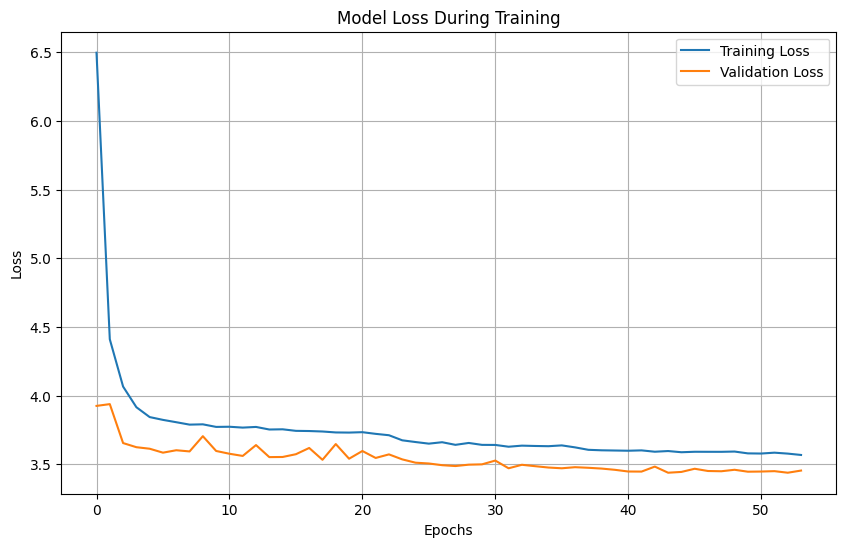

CPU times: total: 203 ms
Wall time: 602 ms


In [14]:
%%time
# Plotting the loss 
print(f"ANN RMSE: {ann_rmse:.4f}")  
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')  
plt.plot(history.history['val_loss'], label='Validation Loss')  

plt.title('Model Loss During Training')  
plt.xlabel('Epochs')  
plt.ylabel('Loss')  
plt.legend()  
plt.grid()  
plt.show()


CPU times: total: 0 ns
Wall time: 0 ns


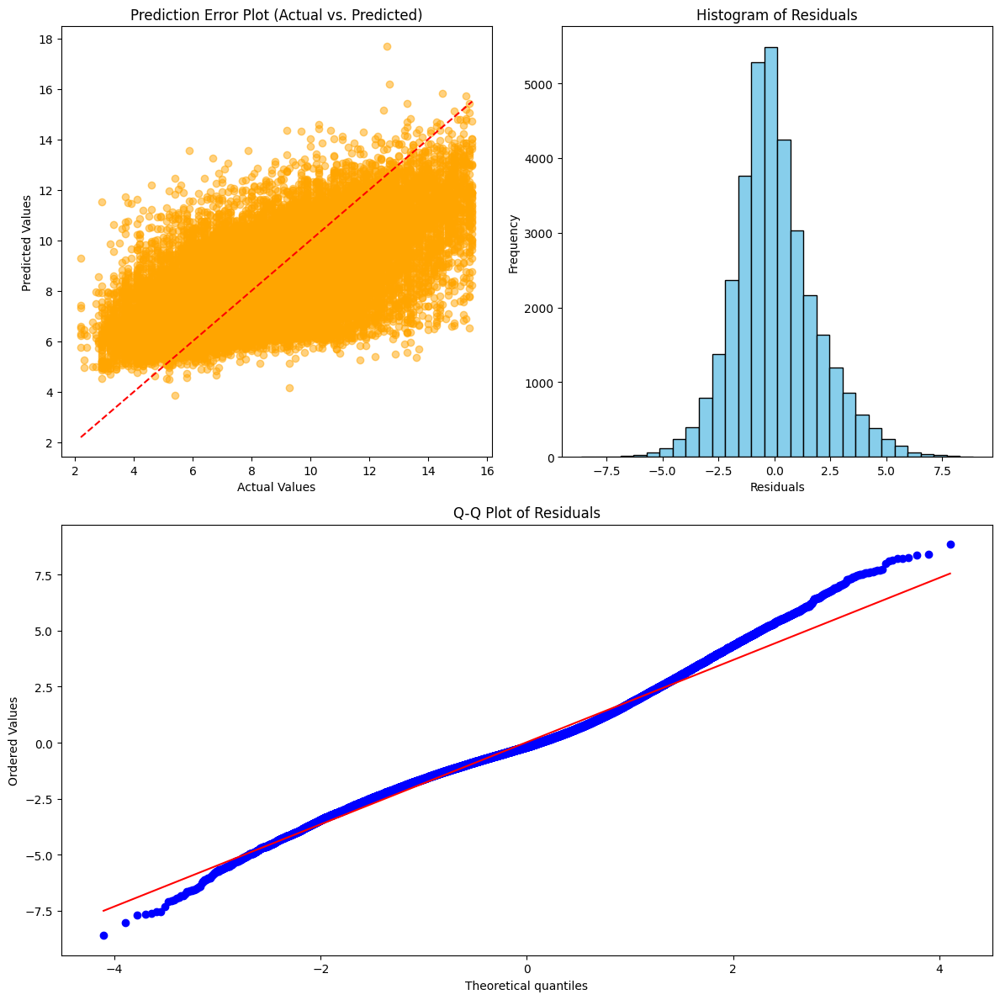

In [15]:
%time
import scipy.stats as stats

residuals = y_test.values - ann_predictions.flatten()

plt.figure(figsize=(12, 12))

# Prediction Error Plot (subplot 1)
plt.subplot(2, 2, 1)  # 2 rows, 2 columns, first subplot
plt.scatter(y_test, ann_predictions, color='orange', alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Prediction Error Plot (Actual vs. Predicted)")

# Histogram of Residuals (subplot 2)
plt.subplot(2, 2, 2)  # 2 rows, 2 columns, second subplot
plt.hist(residuals, bins=30, color='skyblue', edgecolor='black')
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Histogram of Residuals")

# Q-Q Plot of Residuals (subplot 3 - on row 2, column span)
plt.subplot(2, 1, 2)  # 2 rows, 1 column, third subplot
stats.probplot(residuals, dist="norm", plot=plt)
plt.title("Q-Q Plot of Residuals")

# Adjust spacing between subplots
plt.tight_layout()
plt.show()

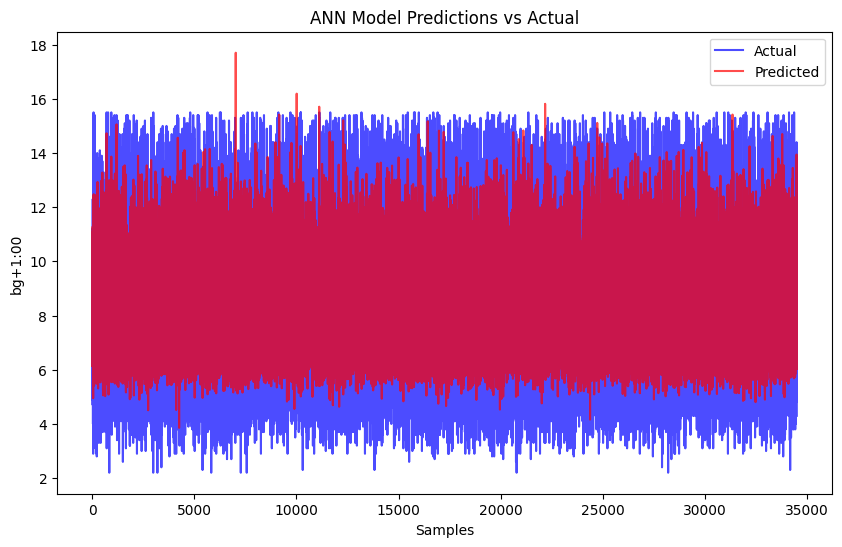

In [16]:
# Plot predictions vs actual values
plt.figure(figsize=(10, 6))
plt.plot(y_test.values, label="Actual", color='blue', alpha=0.7)
plt.plot(ann_predictions, label="Predicted", color='red', alpha=0.7)
plt.xlabel("Samples")
plt.ylabel("bg+1:00")
plt.title("ANN Model Predictions vs Actual")
plt.legend()
plt.show()

Logistic Regression Accuracy: 0.7552
Confusion Matrix:
[[13821  3475]
 [ 4974 12238]]


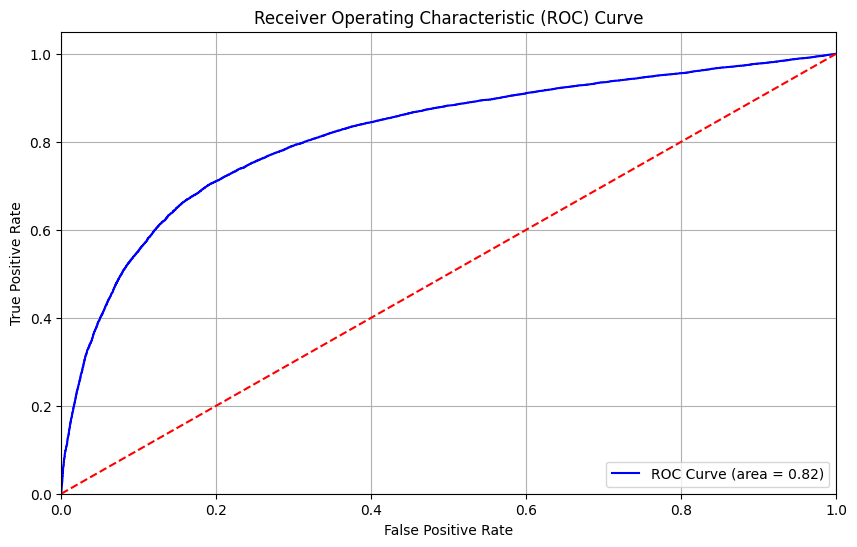

In [20]:


from sklearn.linear_model import LogisticRegression  # Import Logistic Regression
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, auc  # Import metrics for evaluation
import matplotlib.pyplot as plt  # Ensure matplotlib is imported for plotting

# Assuming 'target_column' is the name of the column you want to predict
target_column = 'bg+1:00'  # Update this to your actual target column

# Define a threshold value for binary classification
threshold_value = df_cleaned[target_column].median()  # Example: using the median as the threshold

# Prepare the data for logistic regression
X = df_cleaned.drop(columns=[target_column])  # Features
y = (df_cleaned[target_column] > threshold_value).astype(int)  # Binary target

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize and fit the logistic regression model
logistic_model = LogisticRegression(max_iter=1000)  # Increase max_iter if needed
logistic_model.fit(X_train, y_train)

# Make predictions
y_pred = logistic_model.predict(X_test)
y_pred_proba = logistic_model.predict_proba(X_test)[:, 1]  # Get probabilities for the positive class

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)

print(f"Logistic Regression Accuracy: {accuracy:.4f}")
print("Confusion Matrix:")
print(conf_matrix)

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='red', linestyle='--')  # Diagonal line
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()


In [21]:
# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
roc_auc = auc(fpr, tpr)

# Print the AUC value
print(f"AUC: {roc_auc:.4f}")

AUC: 0.8169
